In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import ConcatDataset, Subset, Dataset, DataLoader
from torchvision.datasets import OxfordIIITPet
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter
from tqdm import tqdm
import torchvision.utils as vutils
from torchinfo import summary

In [3]:
numClasses = 37
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [4]:
dataset_root = './data'

trainDataset = OxfordIIITPet(
    root=dataset_root,
    split='trainval',
    target_types='category',
    download=True
)
testDataset = OxfordIIITPet(
    root='./data',
    split='test',
    target_types='category',
    transform=None,
    download=True
)
dataset = ConcatDataset([trainDataset, testDataset])

selectedClasses = list(range(numClasses))
labels = [i for i, (_, label) in enumerate(dataset) if label in selectedClasses]
subset = Subset(dataset, labels)

labels = [label for _, label in Subset(dataset, labels)]
classes = Counter(labels)

100%|██████████| 791918971/791918971 [00:19<00:00, 41061604.02it/s]


Extracting data/oxford-iiit-pet/images.tar.gz to data/oxford-iiit-pet


100%|██████████| 19173078/19173078 [00:01<00:00, 19106823.95it/s]


Extracting data/oxford-iiit-pet/annotations.tar.gz to data/oxford-iiit-pet


In [6]:
class OxfordPetDataset(Dataset):
    def __init__(self, dataset, transform=None):
        self.dataset = dataset
        self.transform = transform

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        image, label = self.dataset[idx]

        if self.transform:
            image = self.transform(image)

        return image, torch.tensor(label, dtype = torch.long)

In [7]:
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

trainDataset = OxfordPetDataset(
    dataset=subset,
    transform=transform
)
trainLoader = DataLoader(trainDataset, batch_size=256, shuffle=True, pin_memory=True)

In [16]:
class Autoencoder(nn.Module):
    def __init__(self, channels=3):
        super(Autoencoder, self).__init__()

        self.encoder = nn.Sequential(
            nn.Conv2d(channels, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1), 
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),

            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1), 
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),

            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1),  
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True)
        )

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1),  
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),  
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),  
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(64, channels, kernel_size=4, stride=2, padding=1), 
            nn.Tanh()  
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

In [17]:
autoencoder = Autoencoder(channels=3)
if device == 'cuda': 
        autoencoder = nn.DataParallel(autoencoder)
autoencoder = autoencoder.to(device)

def weights_init_normal(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

autoencoder.apply(weights_init_normal)

DataParallel(
  (module): Autoencoder(
    (encoder): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (4): ReLU(inplace=True)
      (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (7): ReLU(inplace=True)
      (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (10): ReLU(inplace=True)
    )
    (decoder): Sequential(
      (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): R

In [13]:
summary(autoencoder, input_size = (1, 3, 128, 128))

Layer (type:depth-idx)                   Output Shape              Param #
DataParallel                             [1, 3, 128, 128]          --
├─Autoencoder: 1-1                       [1, 3, 128, 128]          5,515,267
├─Autoencoder: 1-2                       --                        --
│    └─Sequential: 2-1                   [1, 512, 8, 8]            2,758,336
│    └─Sequential: 2-2                   --                        --
│    │    └─Conv2d: 3-1                  [1, 64, 64, 64]           3,136
│    │    └─ReLU: 3-2                    [1, 64, 64, 64]           --
│    │    └─Conv2d: 3-3                  [1, 128, 32, 32]          131,200
│    │    └─BatchNorm2d: 3-4             [1, 128, 32, 32]          256
│    │    └─ReLU: 3-5                    [1, 128, 32, 32]          --
│    │    └─Conv2d: 3-6                  [1, 256, 16, 16]          524,544
│    │    └─BatchNorm2d: 3-7             [1, 256, 16, 16]          512
│    │    └─ReLU: 3-8                    [1, 256, 16, 16

In [18]:
def train_autoencoder(autoencoder, train_loader, criterion, optimizer, num_epochs=50, device='cuda'):
    autoencoder.to(device)

    dataiter = iter(train_loader)
    fixed_images, _ = next(dataiter)
    fixed_images = fixed_images.to(device)

    for epoch in range(1, num_epochs + 1):
        autoencoder.train()
        running_loss = 0.0

        for images, _ in tqdm(train_loader, desc=f"Epoch {epoch}/{num_epochs}"):
            images = images.to(device)

            outputs = autoencoder(images)
            loss = criterion(outputs, images)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        avg_loss = running_loss / len(train_loader)
        print(f"\nEpoch [{epoch}/{num_epochs}] | Average Loss: {avg_loss:.6f}")

        if epoch % 5 == 0 or epoch == 1:
            with torch.no_grad():
                Generated = autoencoder(fixed_images)
            grid1 = vutils.make_grid(fixed_images[0:16], nrow=4, normalize=True)
            grid2 = vutils.make_grid(Generated[0:16], nrow=4, normalize=True)
            np_grid1 = grid1.cpu().numpy()
            np_grid2 = grid2.cpu().numpy()


            fig, axes = plt.subplots(1, 2, figsize=(20, 10))



            axes[0].imshow(np.transpose(np_grid1, (1, 2, 0)))
            axes[0].set_title(f"Epoch {epoch} | Original")
            axes[0].axis('off')
            
            
            axes[1].imshow(np.transpose(np_grid2, (1, 2, 0)))
            axes[1].set_title(f"Epoch {epoch} | Generated")
            axes[1].axis('off')

            plt.tight_layout()
            plt.show()
            
    print("Training Completed.")

Epoch 1/20: 100%|██████████| 29/29 [00:37<00:00,  1.30s/it]



Epoch [1/20] | Average Loss: 0.101155


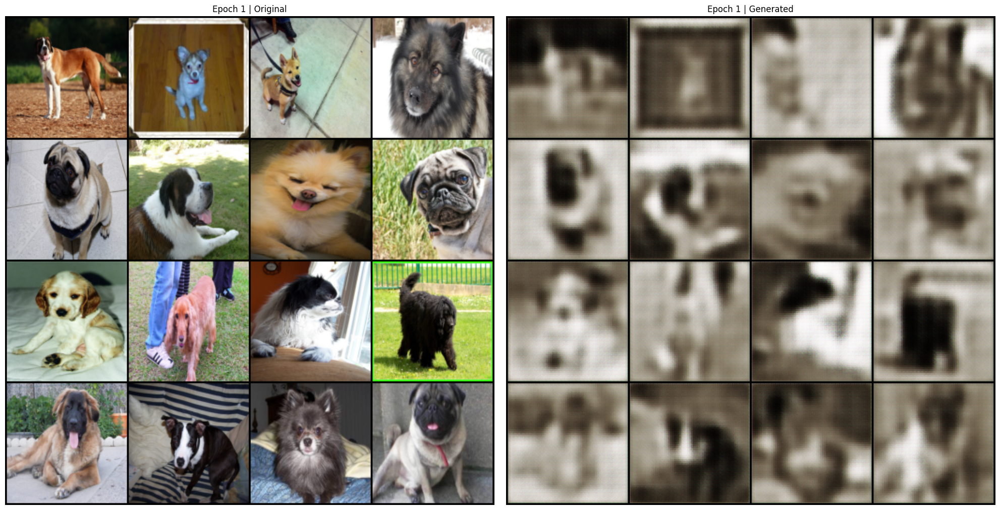

Epoch 2/20: 100%|██████████| 29/29 [00:37<00:00,  1.29s/it]



Epoch [2/20] | Average Loss: 0.047721


Epoch 3/20: 100%|██████████| 29/29 [00:37<00:00,  1.29s/it]



Epoch [3/20] | Average Loss: 0.032368


Epoch 4/20: 100%|██████████| 29/29 [00:37<00:00,  1.29s/it]



Epoch [4/20] | Average Loss: 0.025625


Epoch 5/20: 100%|██████████| 29/29 [00:37<00:00,  1.29s/it]



Epoch [5/20] | Average Loss: 0.022604


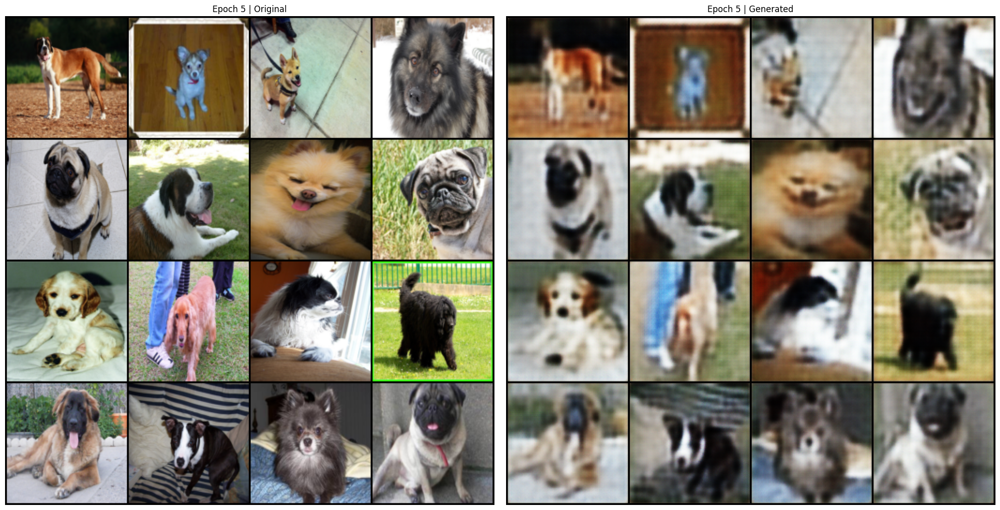

Epoch 6/20: 100%|██████████| 29/29 [00:40<00:00,  1.38s/it]



Epoch [6/20] | Average Loss: 0.018940


Epoch 7/20: 100%|██████████| 29/29 [00:37<00:00,  1.28s/it]



Epoch [7/20] | Average Loss: 0.017511


Epoch 8/20: 100%|██████████| 29/29 [00:37<00:00,  1.28s/it]



Epoch [8/20] | Average Loss: 0.015901


Epoch 9/20: 100%|██████████| 29/29 [00:37<00:00,  1.28s/it]



Epoch [9/20] | Average Loss: 0.015317


Epoch 10/20: 100%|██████████| 29/29 [00:37<00:00,  1.28s/it]



Epoch [10/20] | Average Loss: 0.014515


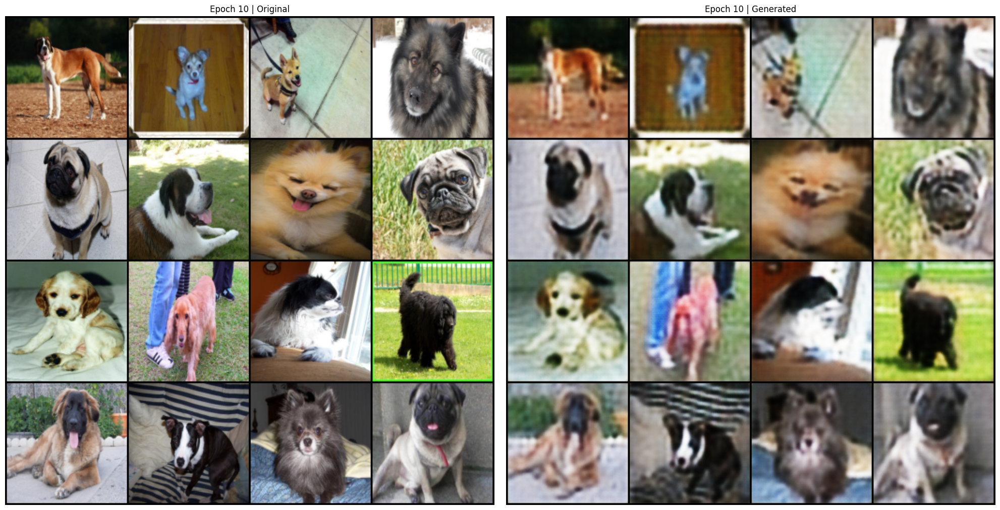

Epoch 11/20: 100%|██████████| 29/29 [00:37<00:00,  1.29s/it]



Epoch [11/20] | Average Loss: 0.013832


Epoch 12/20: 100%|██████████| 29/29 [00:37<00:00,  1.30s/it]



Epoch [12/20] | Average Loss: 0.013182


Epoch 13/20: 100%|██████████| 29/29 [00:37<00:00,  1.29s/it]



Epoch [13/20] | Average Loss: 0.012735


Epoch 14/20: 100%|██████████| 29/29 [00:37<00:00,  1.28s/it]



Epoch [14/20] | Average Loss: 0.012471


Epoch 15/20: 100%|██████████| 29/29 [00:37<00:00,  1.28s/it]



Epoch [15/20] | Average Loss: 0.011835


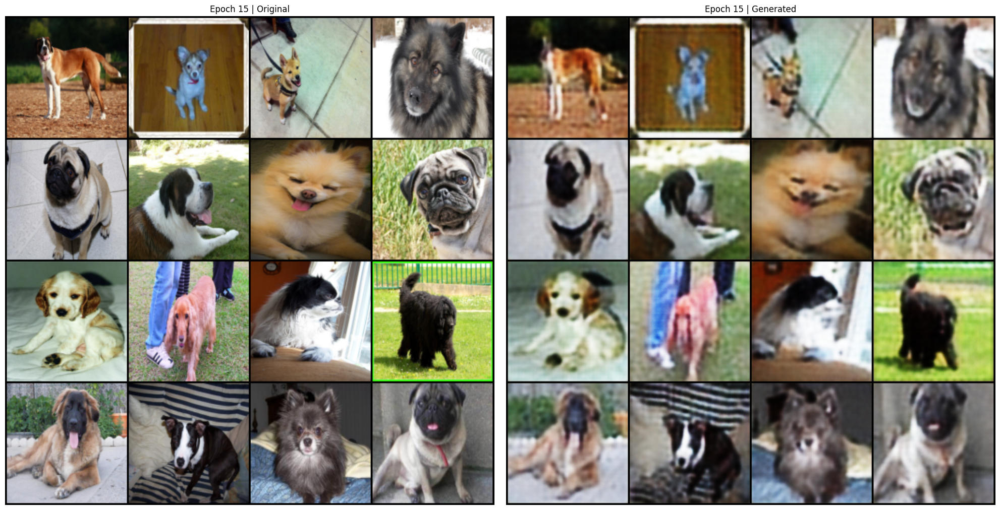

Epoch 16/20: 100%|██████████| 29/29 [00:37<00:00,  1.28s/it]



Epoch [16/20] | Average Loss: 0.011451


Epoch 17/20: 100%|██████████| 29/29 [00:37<00:00,  1.28s/it]



Epoch [17/20] | Average Loss: 0.011002


Epoch 18/20: 100%|██████████| 29/29 [00:37<00:00,  1.29s/it]



Epoch [18/20] | Average Loss: 0.010976


Epoch 19/20: 100%|██████████| 29/29 [00:37<00:00,  1.28s/it]



Epoch [19/20] | Average Loss: 0.010158


Epoch 20/20: 100%|██████████| 29/29 [00:37<00:00,  1.28s/it]



Epoch [20/20] | Average Loss: 0.010061


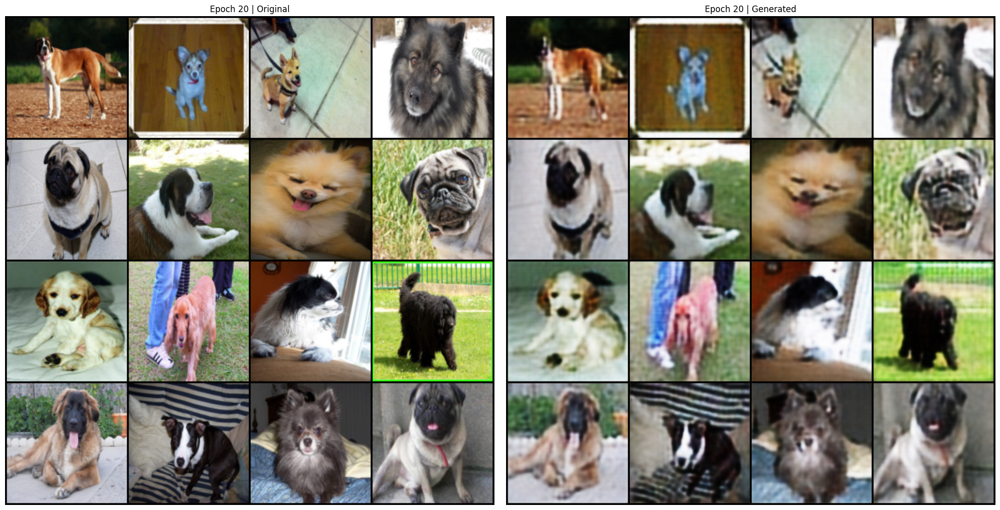

Training Completed.


In [19]:
LossFunc = nn.MSELoss()
optimizer = optim.Adam(autoencoder.parameters(), lr=0.001, betas=(0.9, 0.999))
train_autoencoder(autoencoder, trainLoader, LossFunc, optimizer, num_epochs=20, device=device)